In [1]:
import os
import re
import random 
import json
import matplotlib.pyplot as plt
import numpy as np
import nibabel as nib
import SimpleITK as sitk
import monai.transforms as transforms


from mpl_toolkits.axes_grid1 import make_axes_locatable


<class 'nibabel.nifti1.Nifti1Image'>
data shape (512, 512, 363)
affine:
[[  -0.35546875    0.            0.           45.5       ]
 [   0.            0.35546875    0.         -228.58453369]
 [   0.            0.            0.44999999 -271.88000488]
 [   0.            0.            0.            1.        ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b'?TR:0.000 TE:0.00'
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 512 512 363   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.0000000e+00  3.5546875e-01  3.5546875e-01  4.4999999e-01
  0.0000000e+00  1.0000000e+00  1.0000000e+00  4.3155000e+04]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknow

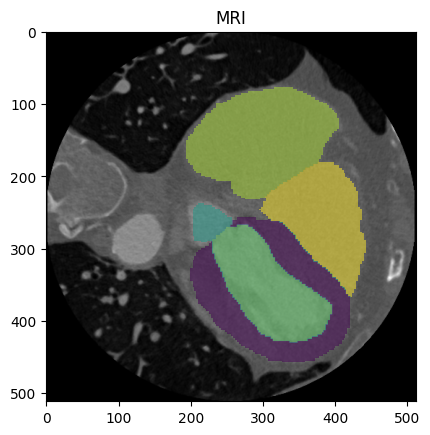

'\nexample_ct = nib.load(\'ct_train/ct_train_1004_image.nii.gz\')\nprint(example_ct)\nlabel = nib.load(\'ct_train/ct_train_1004_label.nii.gz\')\nexample_arr = np.array(example_ct.dataobj)\nexample_mask_arr = np.array(label.dataobj).astype(np.float16)\nprint(np.unique(example_mask_arr))\nexample_mask_arr[example_mask_arr == 0] = np.nan\nprint(example_arr.shape)\nplt.imshow(example_arr[:, :, 70], cmap=\'gray\')\nplt.imshow(example_mask_arr[:, :, 70], alpha=0.5)\nplt.title("CT")\nplt.show()\n'

In [6]:
example_mri = nib.load('ct_train/ct_train_1001_image.nii.gz')
print(example_mri)
label = nib.load('ct_train/ct_train_1001_pred.nii.gz')
print(label)
print(example_mri.dataobj)
example_arr = np.array(example_mri.dataobj)
example_mask_arr = np.array(label.dataobj).astype(np.float16)
print(np.unique(example_mask_arr))
# example_mask_arr[np.logical_or(example_mask_arr != 421, example_mask_arr != 420)] = np.nan
example_mask_arr[example_mask_arr == 0] = np.nan
print(example_arr.shape)
plt.imshow(example_arr[:, :, 150], cmap='gray')
plt.imshow(example_mask_arr[:, :, 150], alpha=0.5)
plt.title("MRI")
plt.show()

'''
example_ct = nib.load('ct_train/ct_train_1004_image.nii.gz')
print(example_ct)
label = nib.load('ct_train/ct_train_1004_label.nii.gz')
example_arr = np.array(example_ct.dataobj)
example_mask_arr = np.array(label.dataobj).astype(np.float16)
print(np.unique(example_mask_arr))
example_mask_arr[example_mask_arr == 0] = np.nan
print(example_arr.shape)
plt.imshow(example_arr[:, :, 70], cmap='gray')
plt.imshow(example_mask_arr[:, :, 70], alpha=0.5)
plt.title("CT")
plt.show()
'''

In [3]:
def bias_correction(
    input_image, 
    mask_image=None,
    shrink_factor=4,
    number_fitting_levels=4,
    maximum_iterations=None
):
    image = input_image
    if mask_image is None:
        mask_image = sitk.OtsuThreshold(input_image, 0, 1, 200)
    if shrink_factor > 1:
        image = sitk.Shrink(
            input_image, [int(shrink_factor)] * input_image.GetDimension()
        )
        mask_image = sitk.Shrink(
            mask_image, [int(shrink_factor)] * input_image.GetDimension()
        )
    corrector = sitk.N4BiasFieldCorrectionImageFilter()
    if maximum_iterations:
        corrector.SetMaximumNumberOfIterations(
            [maximum_iterations] * number_fitting_levels
        )
    corrected_image = corrector.Execute(image, mask_image)
    log_bias_field = corrector.GetLogBiasFieldAsImage(input_image)
    corrected_image_full_resolution = input_image / sitk.Exp(log_bias_field)
    return corrected_image_full_resolution, log_bias_field

In [4]:
input_image = sitk.ReadImage('mr_train/mr_train_1002_image.nii.gz')
input_image = sitk.Cast(input_image, sitk.sitkFloat32)
# Correct
corrected_image, log_bias_field = bias_correction(
    input_image,
    shrink_factor=2,
)

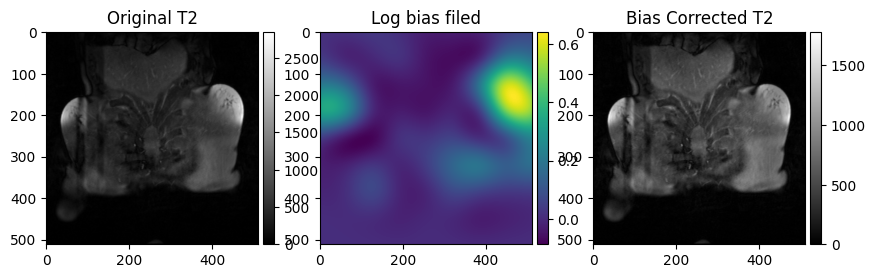

In [5]:
# Plot
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(1, 3, 1)
im1 = ax1.imshow(sitk.GetArrayFromImage(input_image)[20, :, :], cmap='gray')
ax1.title.set_text("Original T2")
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')
ax2 = fig.add_subplot(1, 3, 2)
im2 = ax2.imshow(sitk.GetArrayFromImage(log_bias_field)[20, :, :])
ax2.title.set_text("Log bias filed")
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')
ax3 = fig.add_subplot(1, 3, 3)
im3 = ax3.imshow(sitk.GetArrayFromImage(corrected_image)[20, :, :], cmap='gray')
ax3.title.set_text("Bias Corrected T2")
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im3, cax=cax, orientation='vertical')
plt.show()

Patient:  mr_train_1007_image.nii.gz


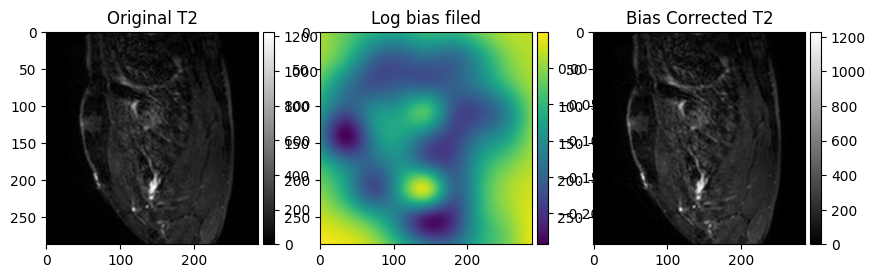

Patient:  mr_train_1010_image.nii.gz


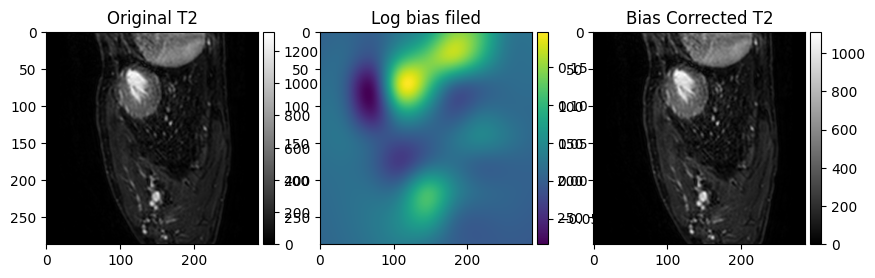

Patient:  mr_train_1018_image.nii.gz


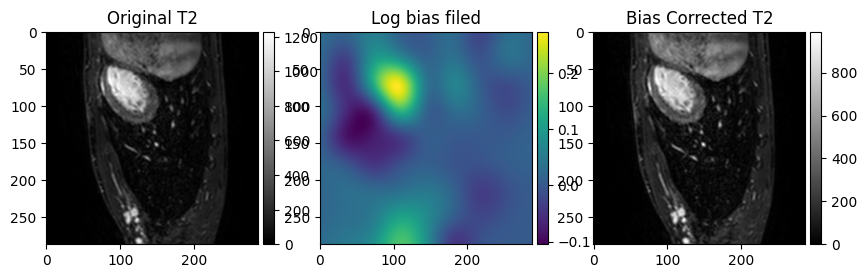

Patient:  mr_train_1020_image.nii.gz


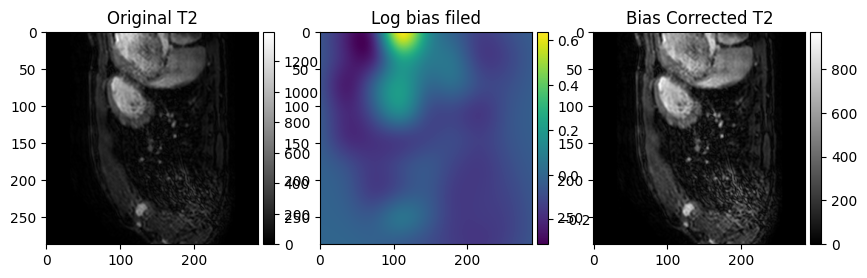

Patient:  mr_train_1008_image.nii.gz


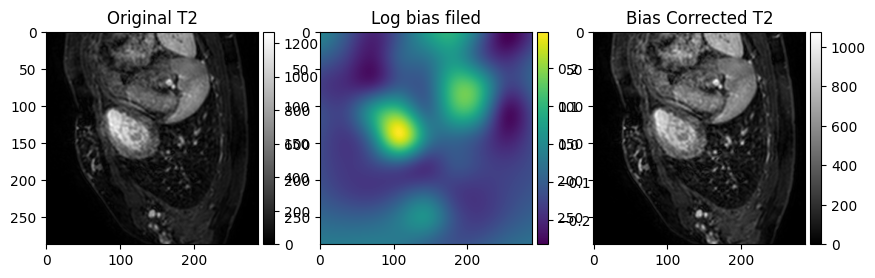

Patient:  mr_train_1006_image.nii.gz


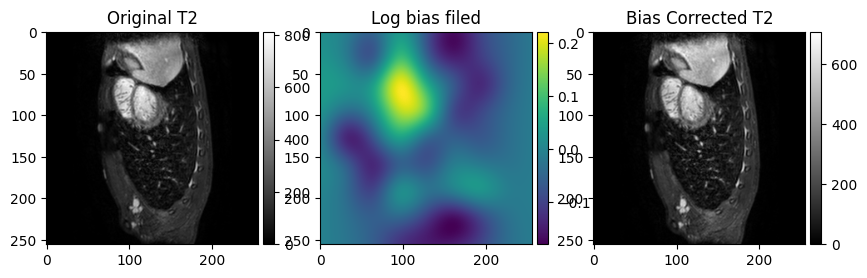

Patient:  mr_train_1004_image.nii.gz


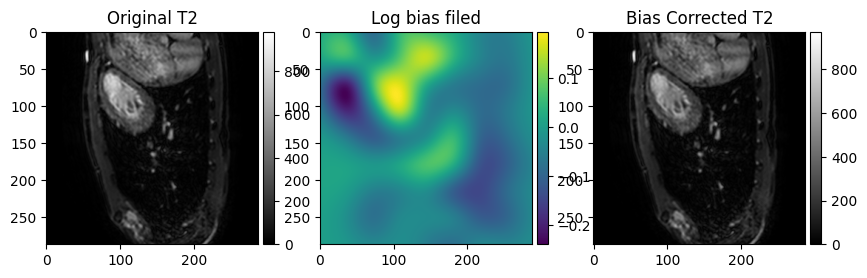

Patient:  mr_train_1016_image.nii.gz


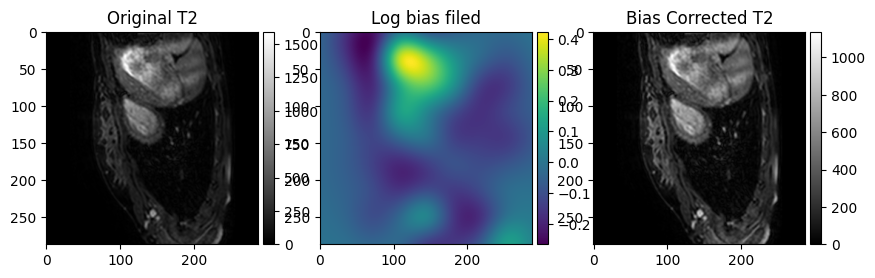

Patient:  mr_train_1019_image.nii.gz


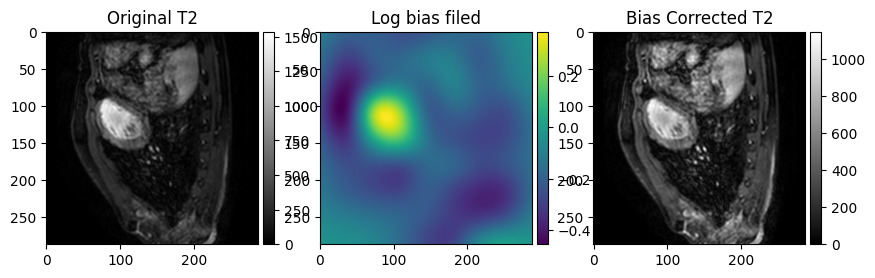

Patient:  mr_train_1005_image.nii.gz


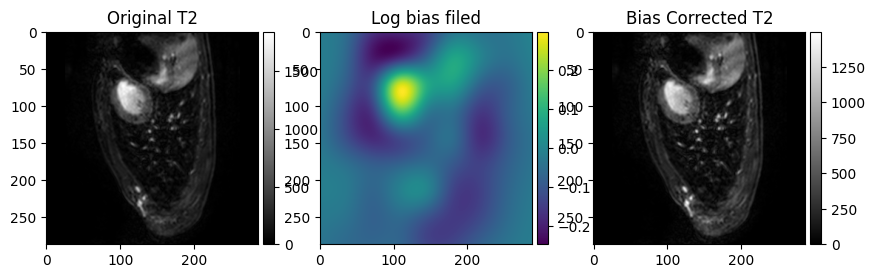

Patient:  mr_train_1001_image.nii.gz


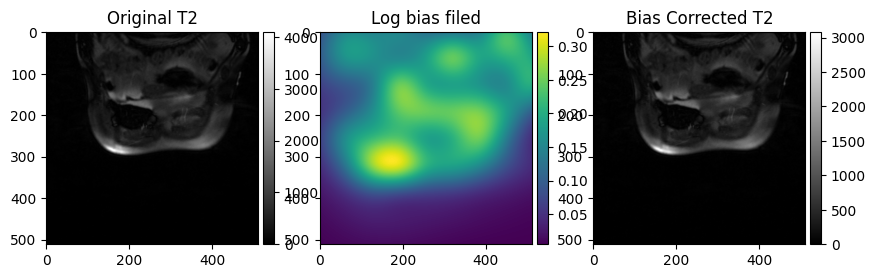

Patient:  mr_train_1009_image.nii.gz


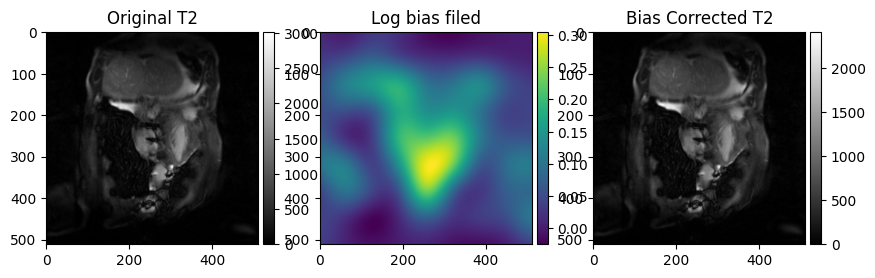

Patient:  mr_train_1014_image.nii.gz


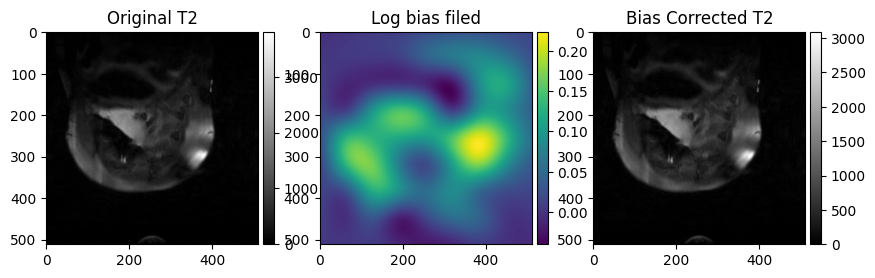

Patient:  mr_train_1013_image.nii.gz


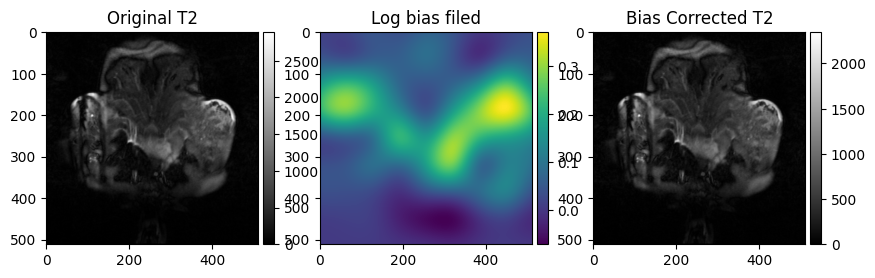

Patient:  mr_train_1015_image.nii.gz


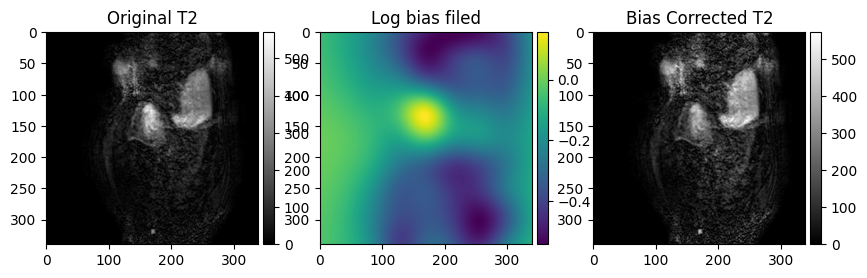

Patient:  mr_train_1003_image.nii.gz


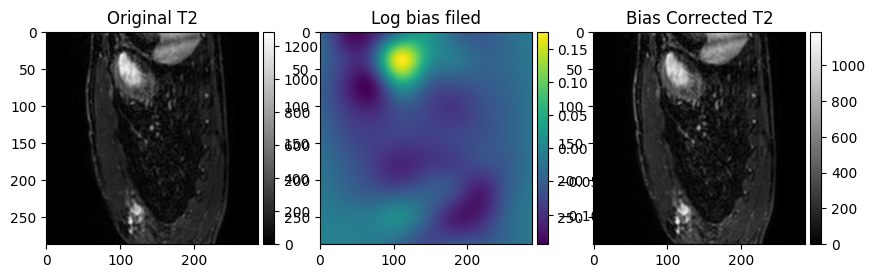

Patient:  mr_train_1017_image.nii.gz


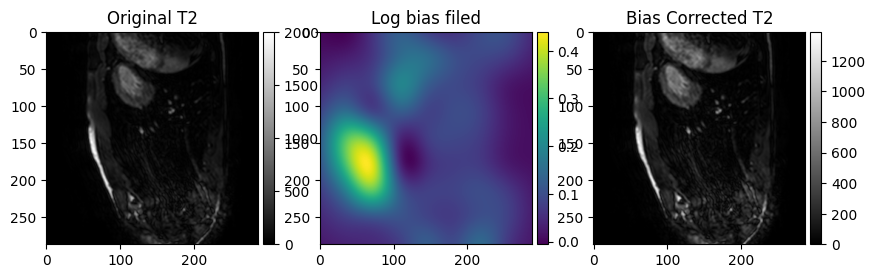

Patient:  mr_train_1011_image.nii.gz


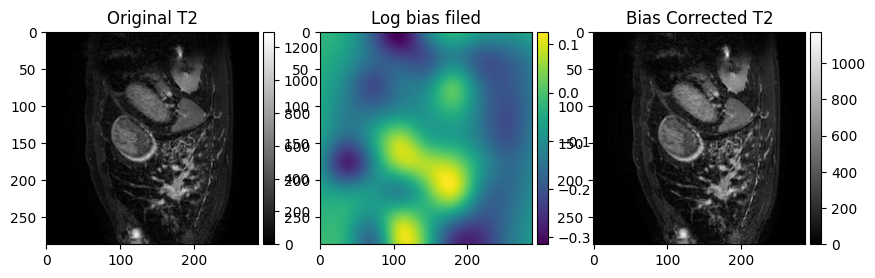

Patient:  mr_train_1012_image.nii.gz


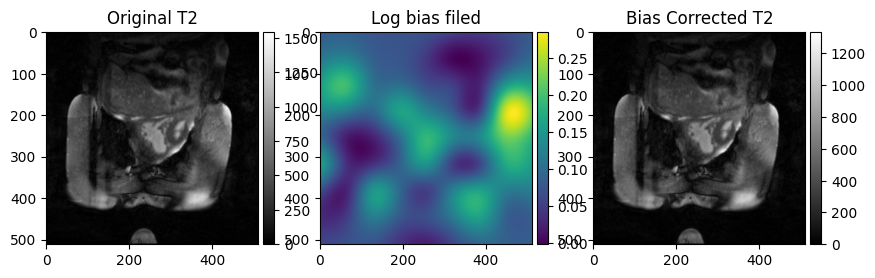

Patient:  mr_train_1002_image.nii.gz


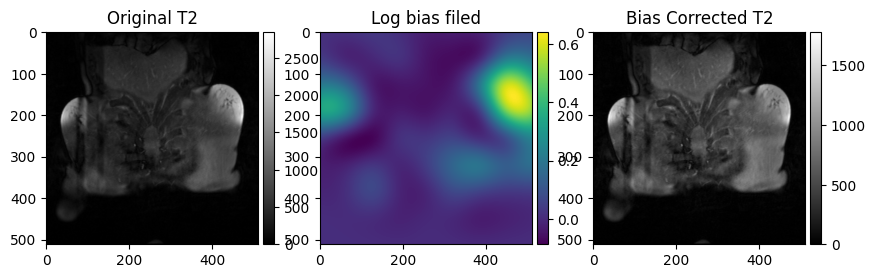

Patient:  mr_test_2034_image.nii.gz


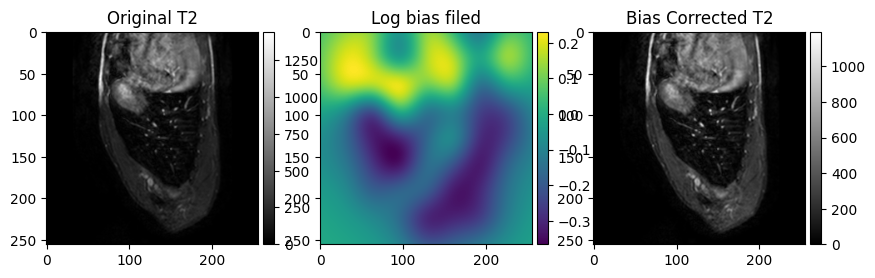

Patient:  mr_test_2011_image.nii.gz


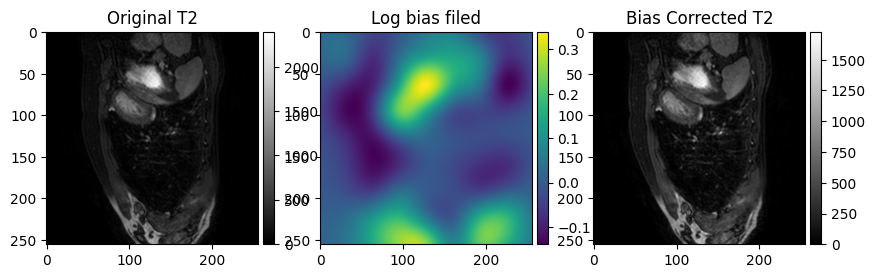

Patient:  mr_test_2030_image.nii.gz


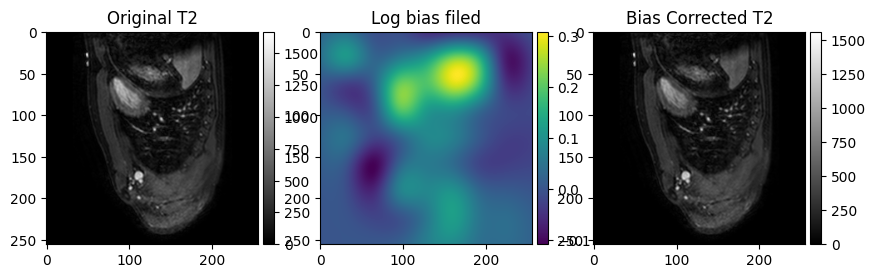

Patient:  mr_test_2015_image.nii.gz


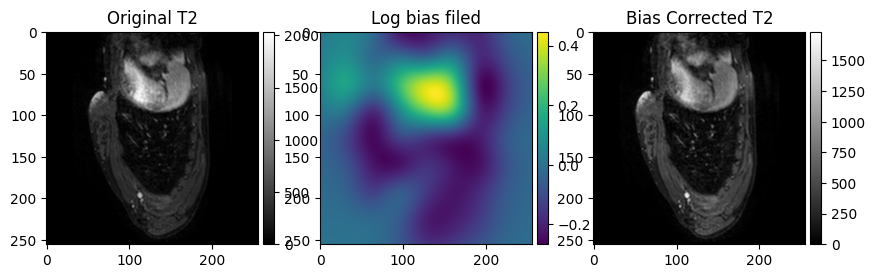

Patient:  mr_test_2027_image.nii.gz


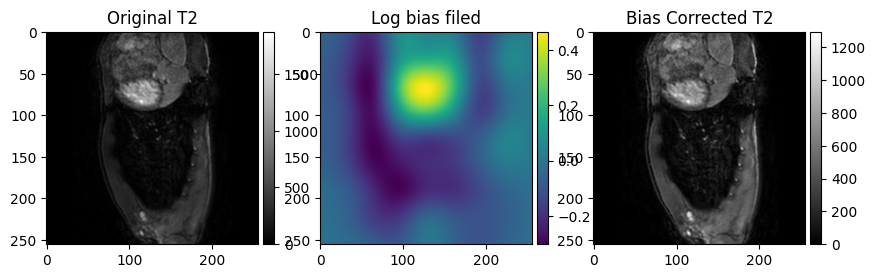

Patient:  mr_test_2025_image.nii.gz


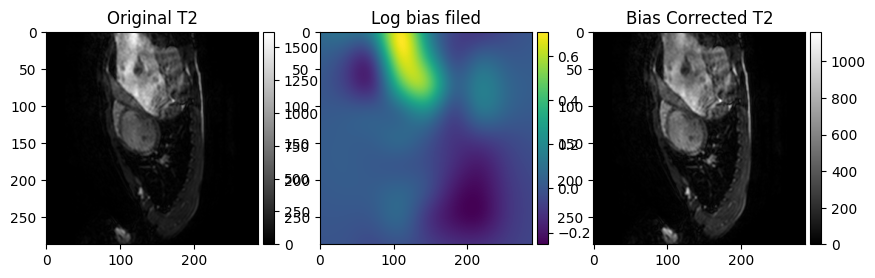

Patient:  mr_test_2023_image.nii.gz


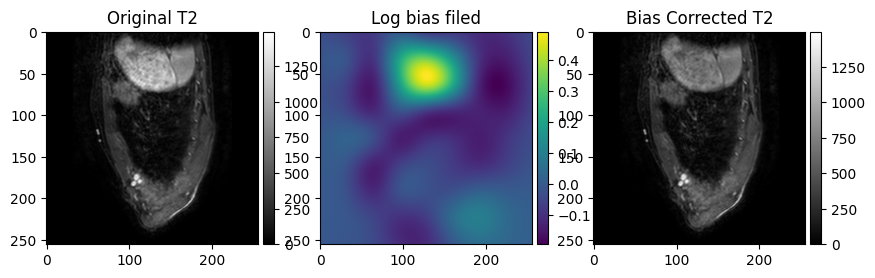

Patient:  mr_test_2024_image.nii.gz


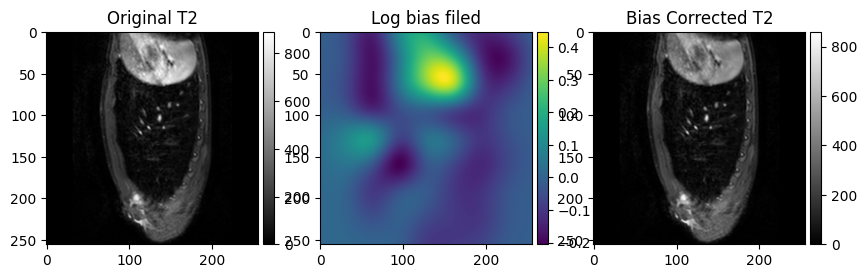

Patient:  mr_test_2037_image.nii.gz


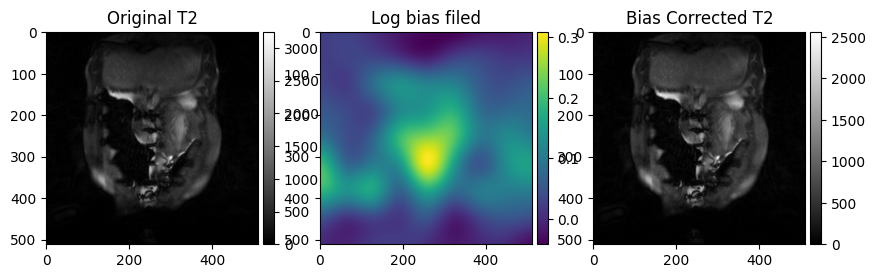

Patient:  mr_test_2031_image.nii.gz


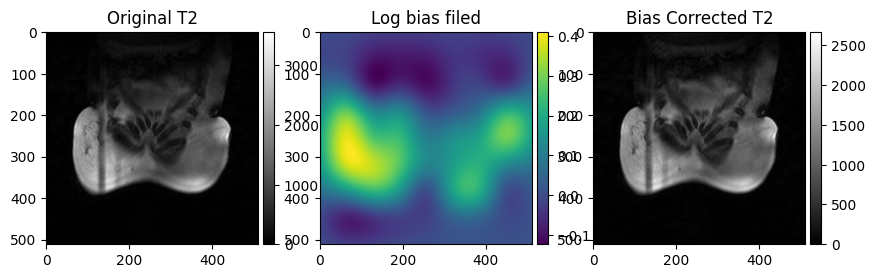

Patient:  mr_test_2040_image.nii.gz


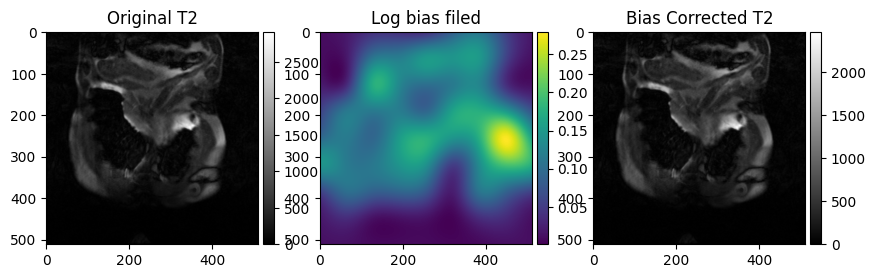

Patient:  mr_test_2038_image.nii.gz


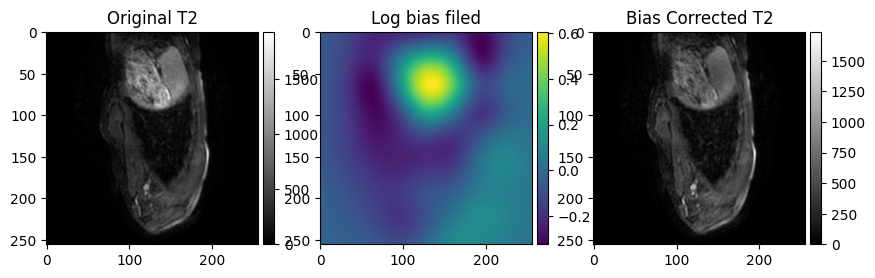

Patient:  mr_test_2033_image.nii.gz


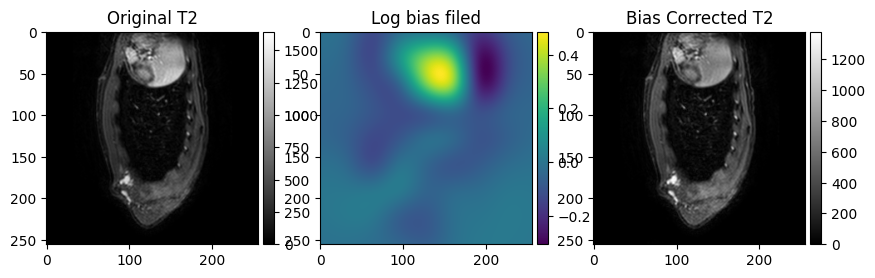

Patient:  mr_test_2005_image.nii.gz


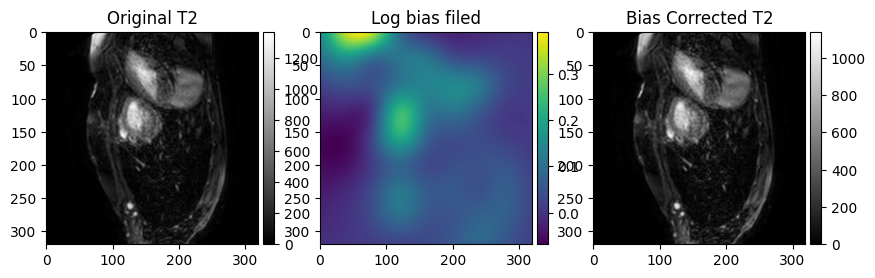

Patient:  mr_test_2020_image.nii.gz


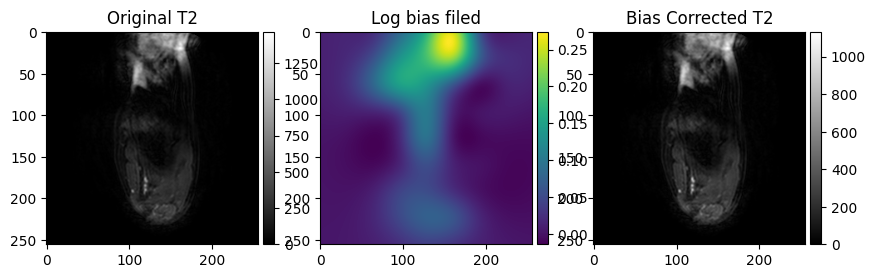

Patient:  mr_test_2018_image.nii.gz


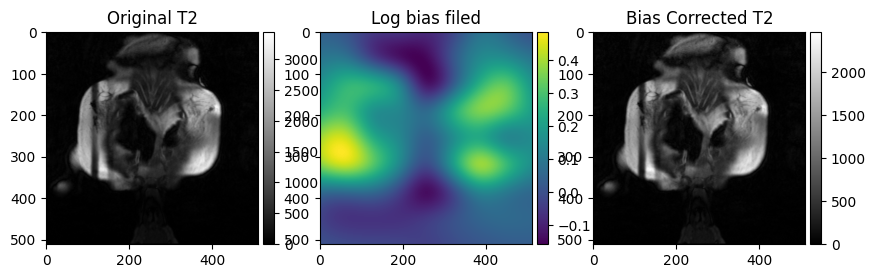

Patient:  mr_test_2004_image.nii.gz


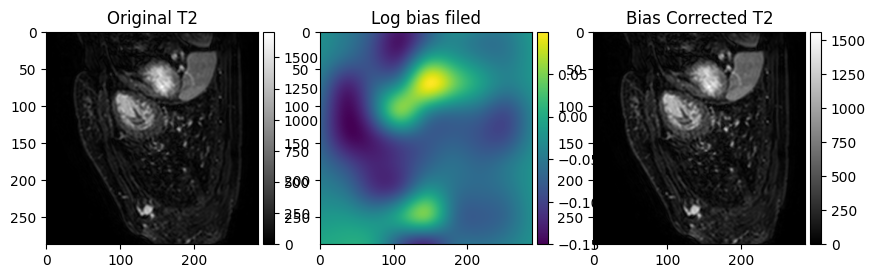

Patient:  mr_test_2036_image.nii.gz


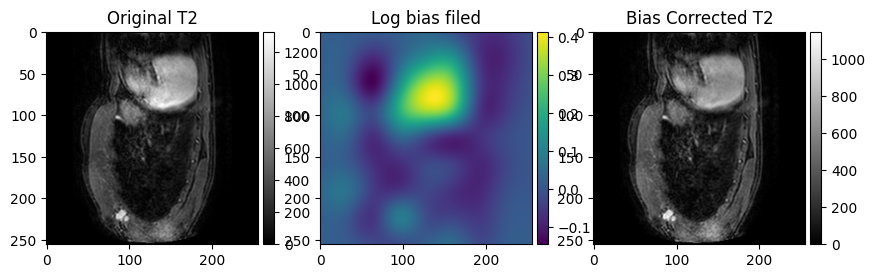

Patient:  mr_test_2032_image.nii.gz


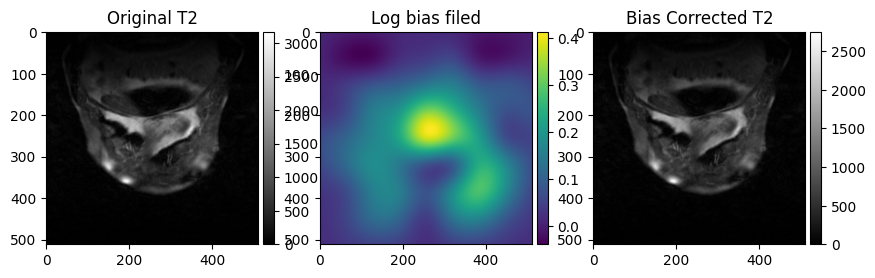

Patient:  mr_test_2014_image.nii.gz


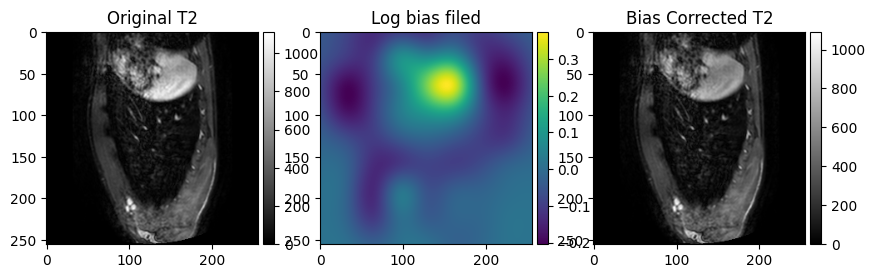

Patient:  mr_test_2026_image.nii.gz


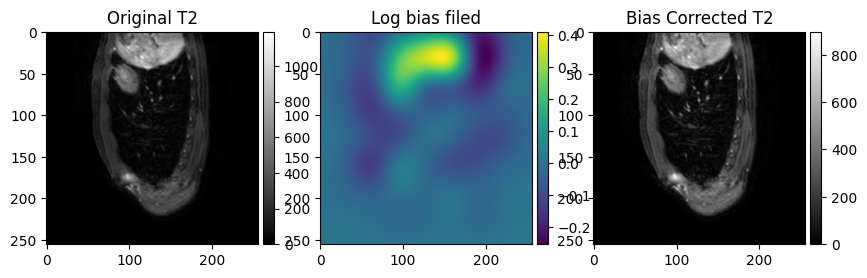

Patient:  mr_test_2021_image.nii.gz


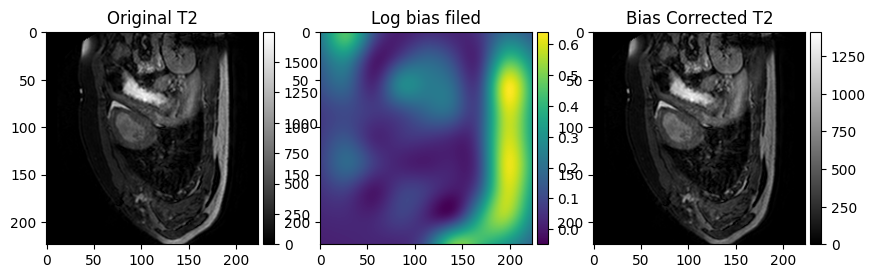

Patient:  mr_test_2007_image.nii.gz


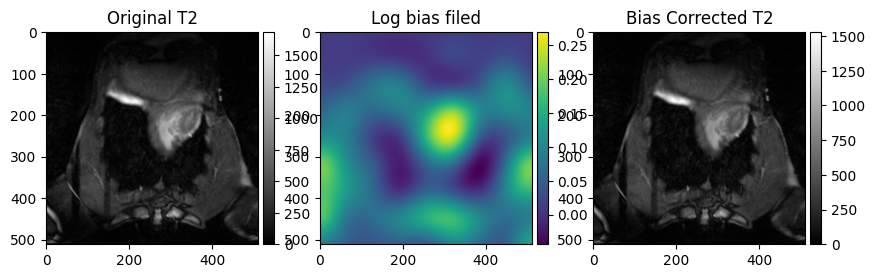

Patient:  mr_test_2009_image.nii.gz


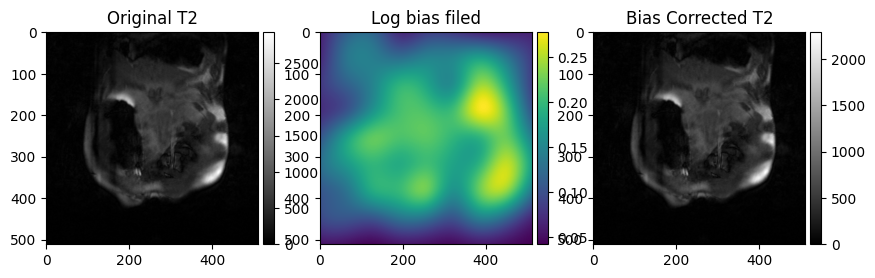

Patient:  mr_test_2008_image.nii.gz


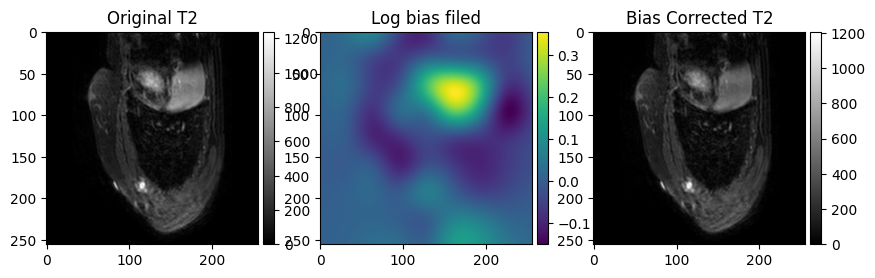

Patient:  mr_test_2001_image.nii.gz


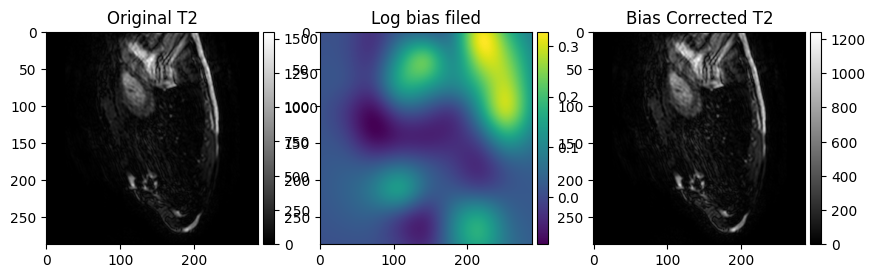

Patient:  mr_test_2029_image.nii.gz


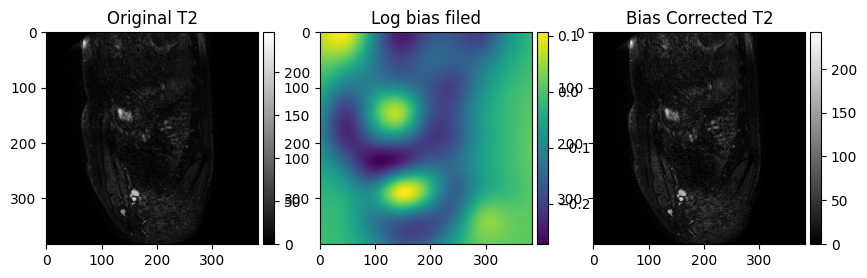

Patient:  mr_test_2028_image.nii.gz


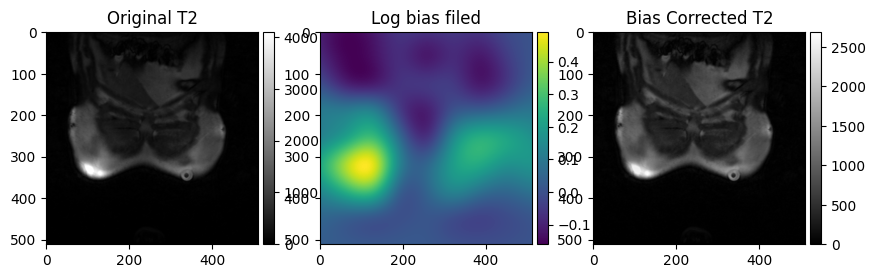

Patient:  mr_test_2010_image.nii.gz


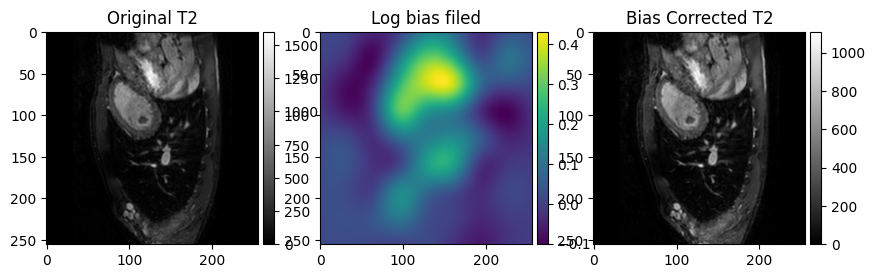

Patient:  mr_test_2003_image.nii.gz


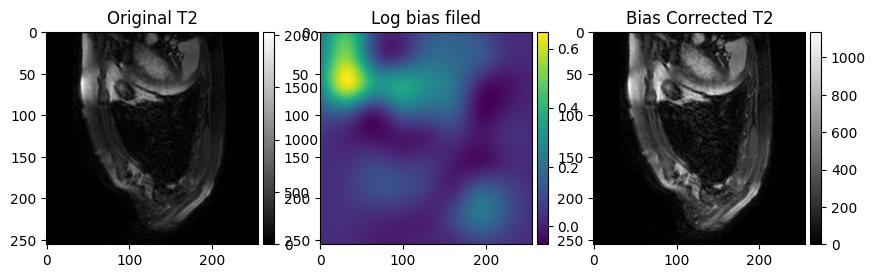

Patient:  mr_test_2019_image.nii.gz


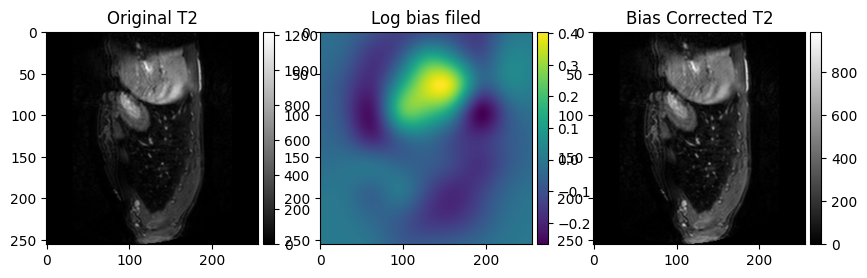

Patient:  mr_test_2017_image.nii.gz


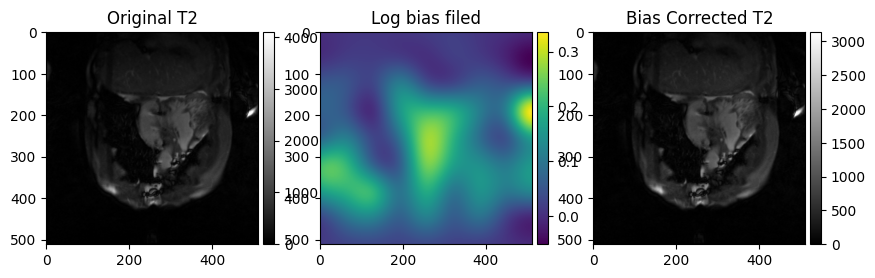

Patient:  mr_test_2022_image.nii.gz


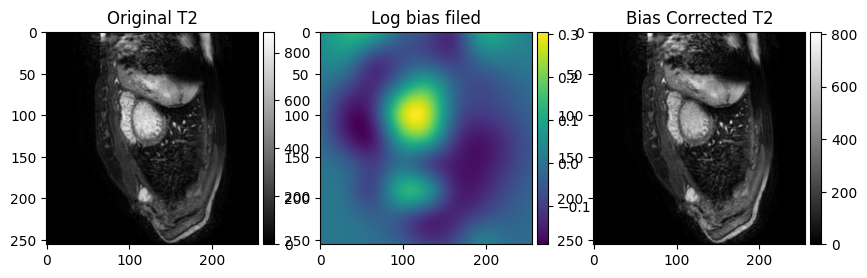

Patient:  mr_test_2012_image.nii.gz


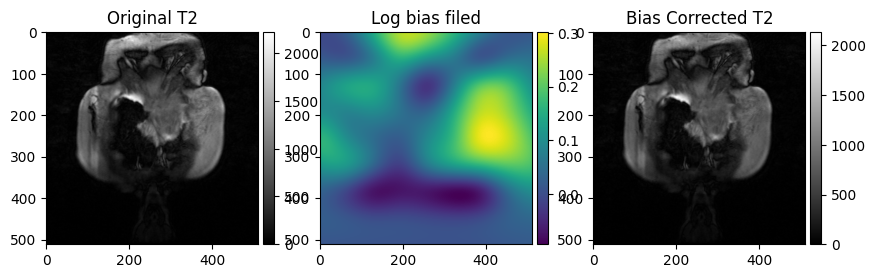

Patient:  mr_test_2016_image.nii.gz


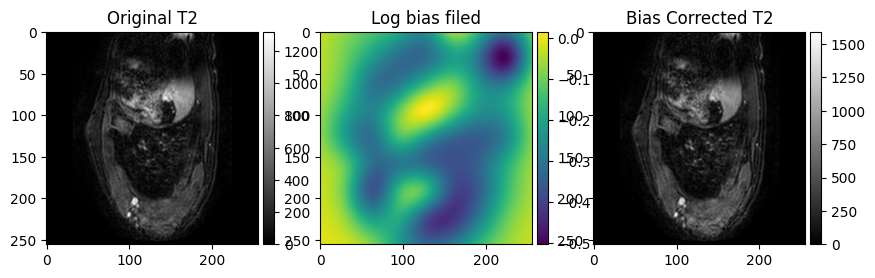

Patient:  mr_test_2006_image.nii.gz


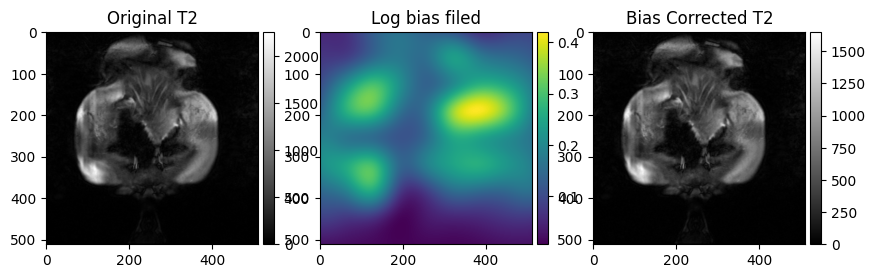

Patient:  mr_test_2013_image.nii.gz


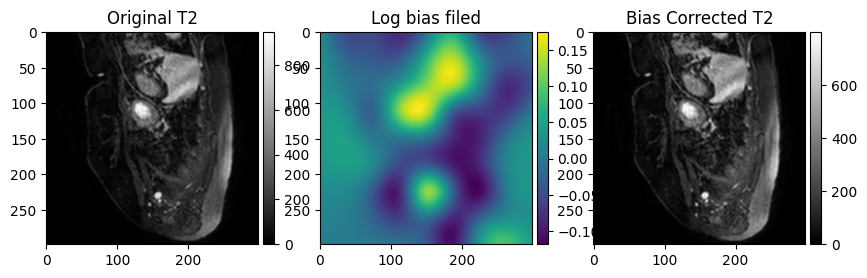

Patient:  mr_test_2035_image.nii.gz


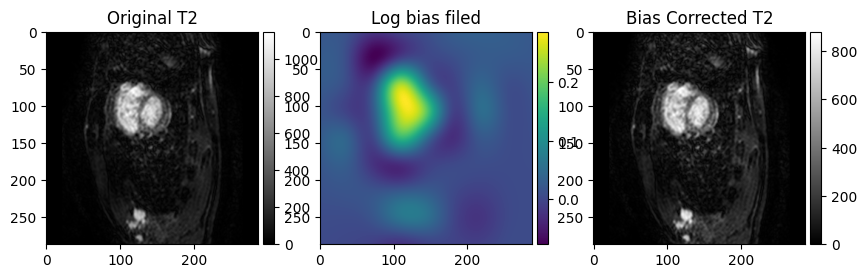

Patient:  mr_test_2002_image.nii.gz


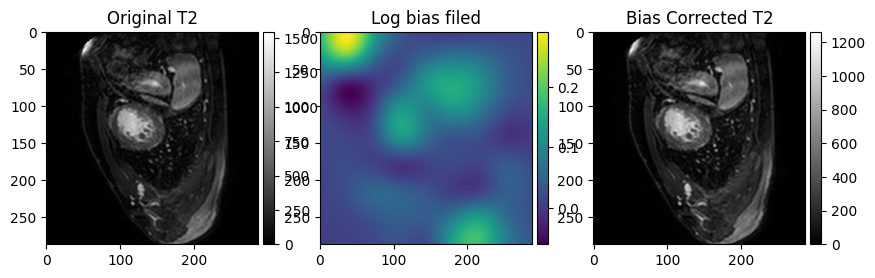

Patient:  mr_test_2039_image.nii.gz


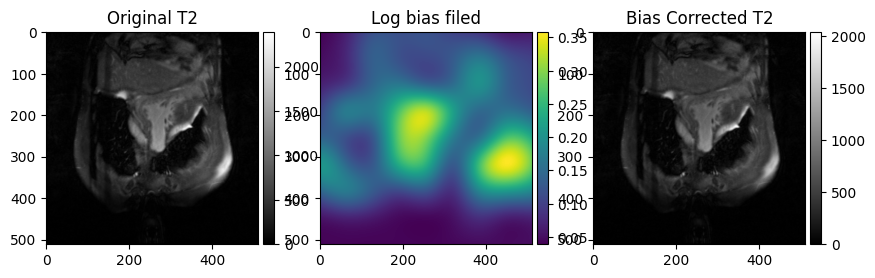

In [24]:
for path in ['mr_train/', 'mr_test/']:
    for patient in os.listdir(path):
        if 'image' in patient:
            print("Patient: ", patient)
            input_image = sitk.ReadImage(os.path.join(path, patient))
            input_image = sitk.Cast(input_image, sitk.sitkFloat32)
            # Correct
            corrected_image, log_bias_field = bias_correction(
                input_image,
                shrink_factor=2,
            )
            # Plot
            fig = plt.figure(figsize=(10, 5))
            ax1 = fig.add_subplot(1, 3, 1)
            im1 = ax1.imshow(sitk.GetArrayFromImage(input_image)[20, :, :], cmap='gray')
            ax1.title.set_text("Original T2")
            divider = make_axes_locatable(ax1)
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(im1, cax=cax, orientation='vertical')
            ax2 = fig.add_subplot(1, 3, 2)
            im2 = ax2.imshow(sitk.GetArrayFromImage(log_bias_field)[20, :, :])
            ax2.title.set_text("Log bias filed")
            divider = make_axes_locatable(ax2)
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(im2, cax=cax, orientation='vertical')
            ax3 = fig.add_subplot(1, 3, 3)
            im3 = ax3.imshow(sitk.GetArrayFromImage(corrected_image)[20, :, :], cmap='gray')
            ax3.title.set_text("Bias Corrected T2")
            divider = make_axes_locatable(ax3)
            cax = divider.append_axes('right', size='5%', pad=0.05)
            fig.colorbar(im3, cax=cax, orientation='vertical')
            plt.show()
            
            # Save modified image 
            '''
            sitk.WriteImage(
                corrected_image, 
                os.path.join(path, patient)
            )
            '''
            img = nib.load(os.path.join(path, patient))
            new_img = nib.Nifti1Image(
                sitk.GetArrayFromImage(corrected_image).swapaxes(0, 2), 
                img.affine, 
                img.header
            )
            nib.save(new_img, os.path.join(path, patient.replace('image', 'image_corrected')))


<class 'nibabel.nifti1.Nifti1Image'>
data shape (288, 288, 160)
affine:
[[   0.            0.            1.04999995 -134.7008667 ]
 [  -1.            0.            0.          172.93592834]
 [   0.            1.            0.         -103.38882446]
 [   0.            0.            0.            1.        ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 288 288 160   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.    1.    1.    1.05  1.    0.    0.    0.  ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 1.95e

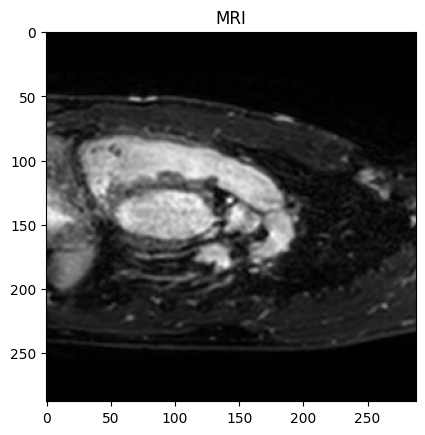


<class 'nibabel.nifti1.Nifti1Image'>
data shape (288, 288, 160)
affine:
[[   0.            0.            1.04999995 -134.7008667 ]
 [  -1.            0.            0.          172.93592834]
 [   0.            1.            0.         -103.38882446]
 [   0.            0.            0.            1.        ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 288 288 160   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.    1.    1.    1.05  1.    0.    0.    0.  ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 1.95e

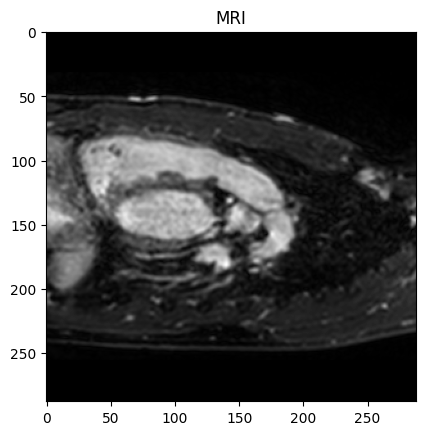

In [26]:
# Check if correct
example_mri = nib.load('mr_train/mr_train_1003_image.nii.gz')
print(example_mri)
example_arr = np.array(example_mri.dataobj)
plt.imshow(example_arr[:, :, 70], cmap='gray')
plt.title("MRI")
plt.show()
example_mri = nib.load('mr_train/mr_train_1003_image_corrected.nii.gz')
print(example_mri)
example_arr = np.array(example_mri.dataobj)
plt.imshow(example_arr[:, :, 70], cmap='gray')
plt.title("MRI")
plt.show()

In [20]:
# Change labels
"""
(1) the left ventricle blood cavity (label value 500);
(2) the right ventricle blood cavity (label value 600);
(3) the left atrium blood cavity (label value 420);
(4) the right atrium blood cavity (label value 550);
(5) the myocardium of the left ventricle (label value 205);
(6) the ascending aorta (label value 820)
(7) the pulmonary artery (label value 850)
"""
for path in ['mr_train/', 'ct_train/']:
    for patient in os.listdir(path):
        if 'label' in patient:
            print("Patient: ", patient)
            label = nib.load(os.path.join(path, patient))
            data =  np.array(label.dataobj)
            print(np.unique(data))
            # Change 
            data[data==500] = 1
            data[data==600] = 2
            # Here there is an error in one label (mr_train_1010_label.nii.gz)
            data[data==420] = 3
            data[data==421] = 3
            data[data==550] = 4
            data[data==205] = 5
            data[data==820] = 6
            data[data==850] = 7
            print(np.unique(data))
            new_label = nib.Nifti1Image(
                data, 
                label.affine, 
                label.header
            )
            '''
            nib.save(
                new_label, 
                os.path.join(path, patient.replace('label', 'label_corrected'))
            )
            '''

Patient:  mr_train_1005_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1002_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1003_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1010_label.nii.gz
[  0 205 420 421 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1014_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1009_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1015_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1016_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1019_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1001_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_train_1011_label.nii.gz
[  0 205 420 500 550 600 820 850]
[0 1 2 3 4 5 6 7]
Patient:  mr_trai


<class 'nibabel.nifti1.Nifti1Image'>
data shape (512, 512, 243)
affine:
[[  -0.43554699    0.            0.          105.30000305]
 [   0.            0.43554699    0.          -89.86451721]
 [   0.            0.            0.625      -224.5       ]
 [   0.            0.            0.            1.        ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 16
dim             : [  3 512 512 243   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.        0.435547  0.435547  0.625     1.        0.        0.
  0.      ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         :

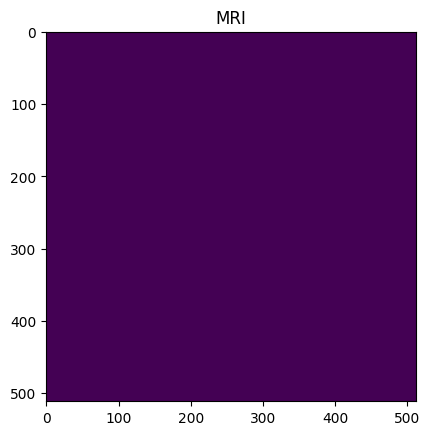


<class 'nibabel.nifti1.Nifti1Image'>
data shape (512, 512, 243)
affine:
[[  -0.43554699    0.            0.          105.30000305]
 [   0.            0.43554699    0.          -89.86451721]
 [   0.            0.            0.625      -224.5       ]
 [   0.            0.            0.            1.        ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 16
dim             : [  3 512 512 243   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.        0.435547  0.435547  0.625     1.        0.        0.
  0.      ]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         :

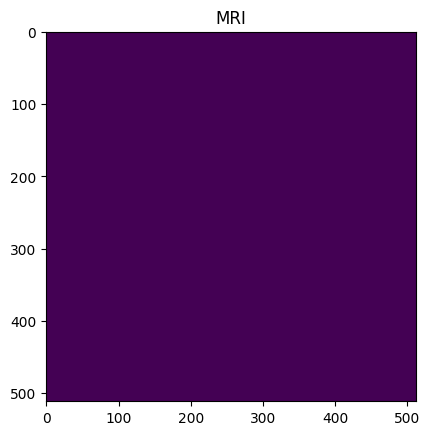

In [27]:
# Check if correct
label = nib.load('ct_train/ct_train_1007_label.nii.gz')
print(label)
example_arr = np.array(label.dataobj)
plt.imshow(example_arr[:, :, 70])
plt.title("MRI")
plt.show()
label = nib.load('ct_train/ct_train_1007_label_corrected.nii.gz')
print(label)
example_arr = np.array(label.dataobj)
plt.imshow(example_arr[:, :, 70])
plt.title("MRI")
plt.show()

In [29]:
# Create JSON MR
path='mr_train'
with open('MR.json', 'r') as f:
        data = json.load(f)
data['training'] = []
data['validation'] = []
data['test'] = []
files = os.listdir(path)
files = [file for file in files if 'image_corrected' in file]
random.shuffle(files)
for file in files[:int(0.8*len(files))]:
    data['training'].append({
        "label": os.path.join(path, file.replace('image', 'label')),
        "image": os.path.join(path, file)
    })
for file in files[int(0.8*len(files)):]:
    data['validation'].append({
        "label": os.path.join(path, file.replace('image', 'label')),
        "image": os.path.join(path, file)
    })
    data['test'].append({
        "label": os.path.join(path, file.replace('image', 'label')),
        "image": os.path.join(path, file)
    })
with open('MR.json', 'w') as fp:
    json.dump(data,fp)

In [30]:
# Create JSON CT
path='ct_train'
with open('CT.json', 'r') as f:
        data = json.load(f)
data['training'] = []
data['validation'] = []
data['test'] = []
files = os.listdir(path)
files = [file for file in files if 'image' in file]
random.shuffle(files)
for file in files[:int(0.8*len(files))]:
    data['training'].append({
        "label": os.path.join(path, file.replace('image', 'label_corrected')),
        "image": os.path.join(path, file)
    })
for file in files[int(0.8*len(files)):]:
    data['validation'].append({
        "label": os.path.join(path, file.replace('image', 'label_corrected')),
        "image": os.path.join(path, file)
    })
    data['test'].append({
        "label": os.path.join(path, file.replace('image', 'label_corrected')),
        "image": os.path.join(path, file)
    })
with open('CT.json', 'w') as fp:
    json.dump(data,fp)

In [31]:
train_transforms = transforms.Compose(
        [
            transforms.LoadImaged(keys=["image", "label"]),
            transforms.EnsureChannelFirstd(keys=["image", "label"]),
            transforms.Orientationd(keys=["image", "label"], axcodes="RAS"),
            transforms.Spacingd(
                keys=["image", "label"], pixdim=(1, 1, 1),
                mode=("bilinear", "nearest")
            ),
            transforms.ScaleIntensityd(keys=["image"]),
            transforms.SpatialPadd(keys=["image", "label"],
                                   spatial_size=(96, 96, 96),
                                   value=0),
            transforms.RandCropByPosNegLabeld(
                keys=["image", "label"],
                label_key="label",
                spatial_size=(96, 96, 96),
                pos=1,
                neg=1,
                num_samples=4,
                image_key="image",
                image_threshold=0,
            ),
            transforms.RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=0),
            transforms.RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=1),
            transforms.RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=2),
            transforms.RandRotate90d(keys=["image", "label"], prob=0.5, max_k=3),
            transforms.RandScaleIntensityd(keys="image", factors=0.1, prob=0.5),
            transforms.RandShiftIntensityd(keys="image", offsets=0.1, prob=0.5),
            transforms.ToTensord(keys=["image", "label"]),
        ]
    )

16


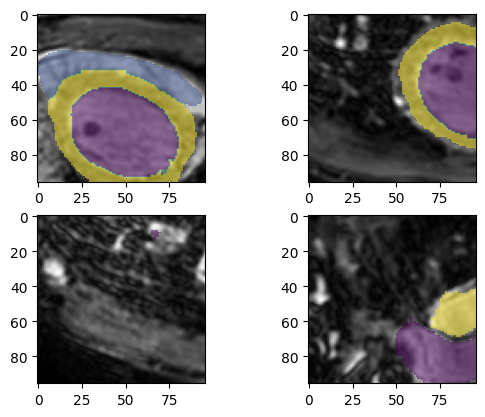

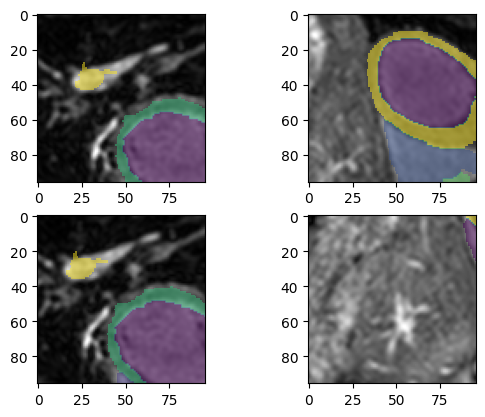

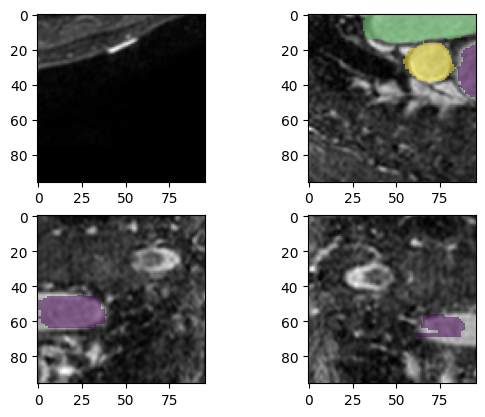

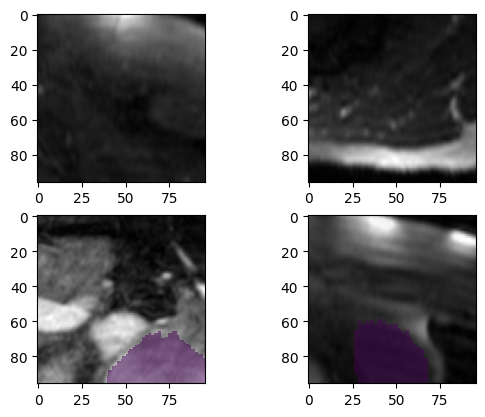

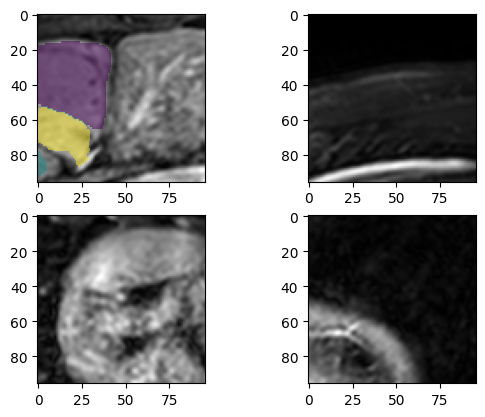

...

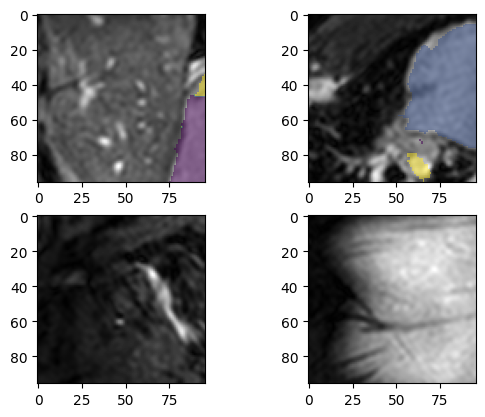

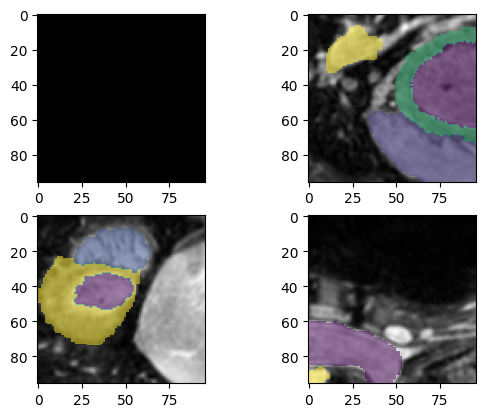

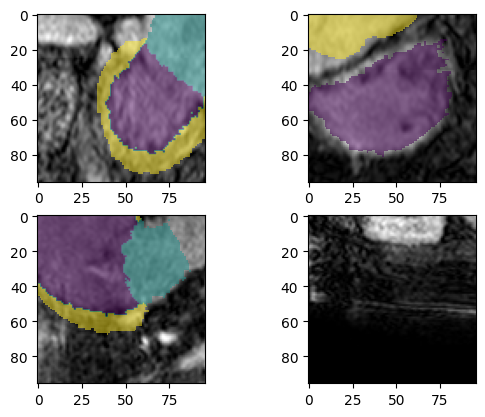

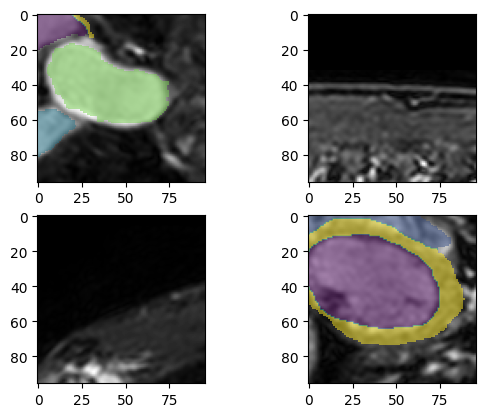

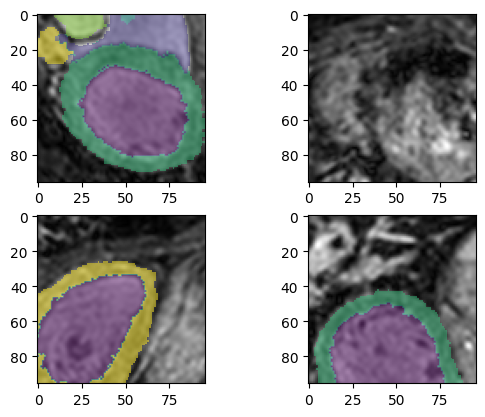

4


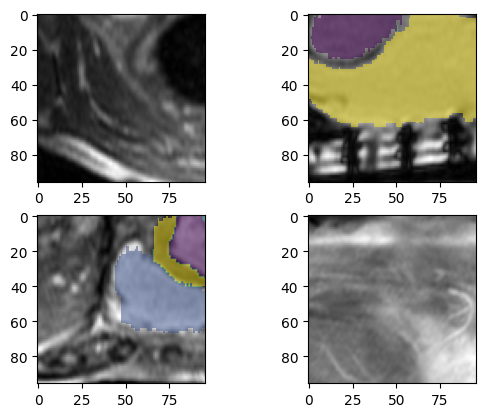

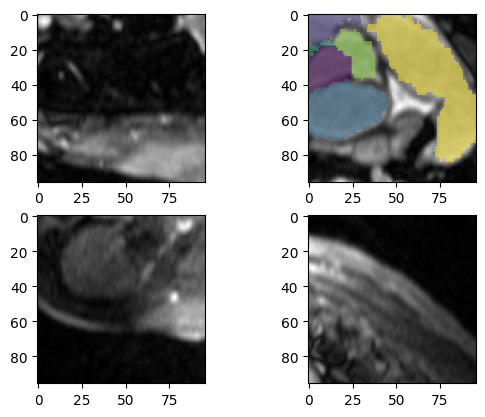

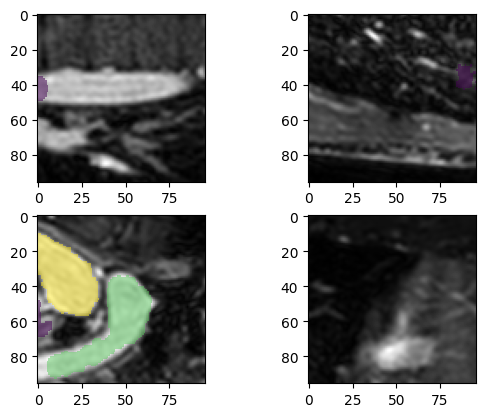

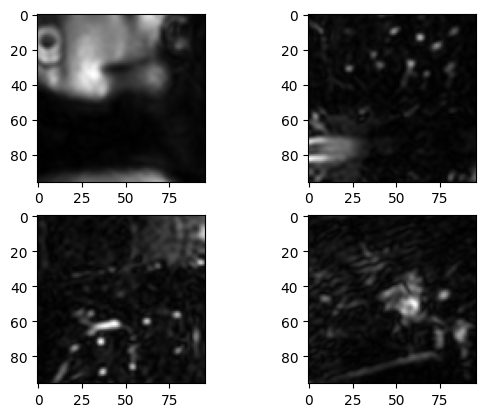

4


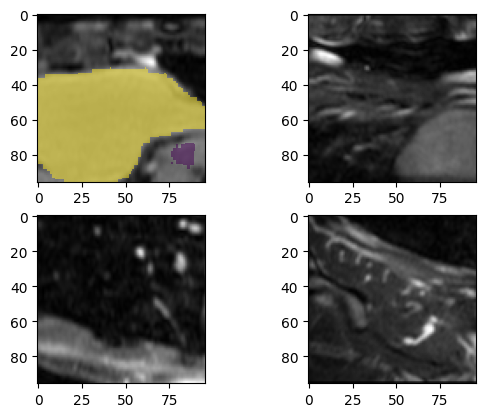

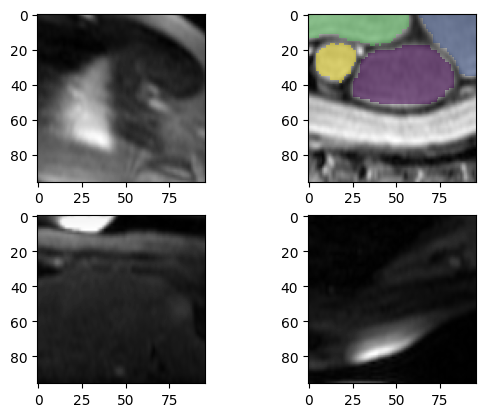

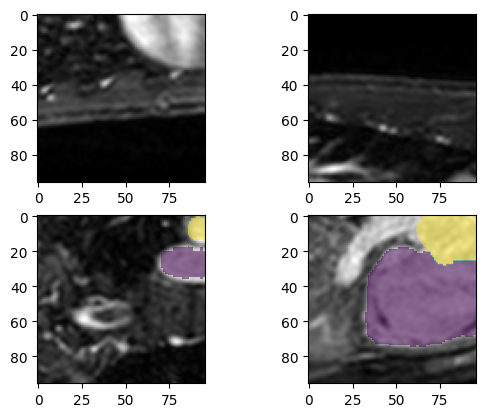

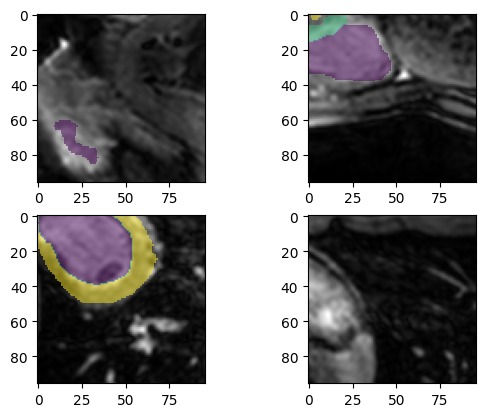

In [32]:
with open('MR.json', 'r') as f:
    dataset = json.load(f)
    print(len(dataset['training']))
    for example in dataset['training']:
        data = train_transforms(example)
        fig, ax = plt.subplots(nrows=2, ncols=2)
        i = 0
        for row in ax:
            for col in row:
                col.imshow(data[i]["image"][0, 90, :, :], cmap="gray")
                data[i]["label"][ data[i]["label"] == 0] = np.nan
                col.imshow(data[i]["label"][0, 90, :, :], alpha=.5)
                i += 1
        plt.show()
    print(len(dataset['validation']))
    for example in dataset['validation']:
        data = train_transforms(example)
        fig, ax = plt.subplots(nrows=2, ncols=2)
        i = 0
        for row in ax:
            for col in row:
                col.imshow(data[i]["image"][0, 90, :, :], cmap="gray")
                data[i]["label"][ data[i]["label"] == 0] = np.nan
                col.imshow(data[i]["label"][0, 90, :, :], alpha=.5)
                i += 1
        plt.show()
    print(len(dataset['test']))
    for example in dataset['test']:
        data = train_transforms(example)
        fig, ax = plt.subplots(nrows=2, ncols=2)
        i = 0
        for row in ax:
            for col in row:
                col.imshow(data[i]["image"][0, 90, :, :], cmap="gray")
                data[i]["label"][ data[i]["label"] == 0] = np.nan
                col.imshow(data[i]["label"][0, 90, :, :], alpha=.5)
                i += 1
        plt.show()

16


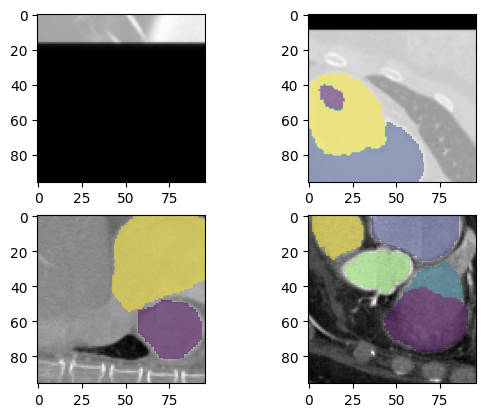

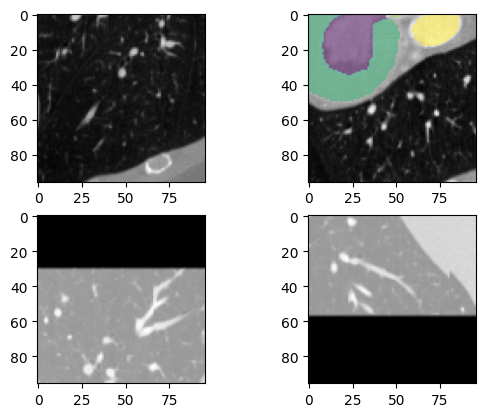

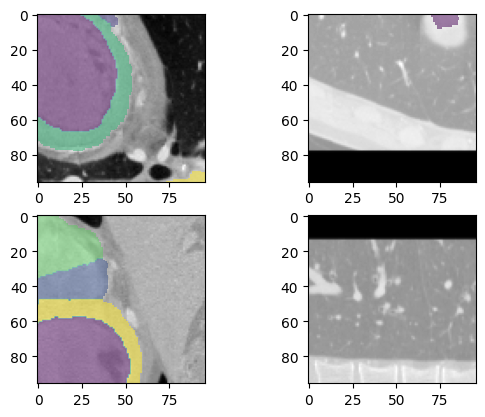

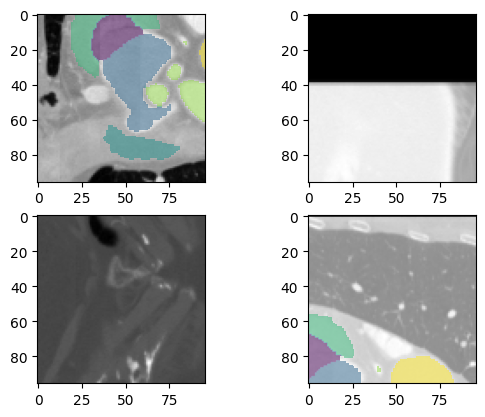

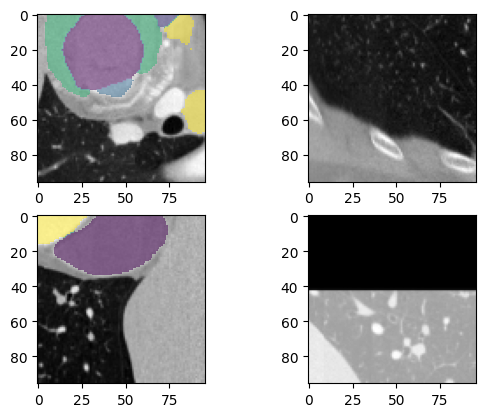

...

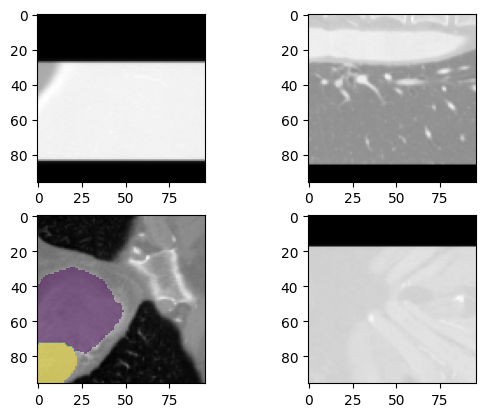

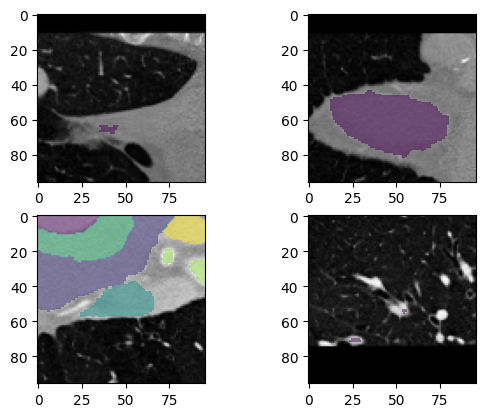

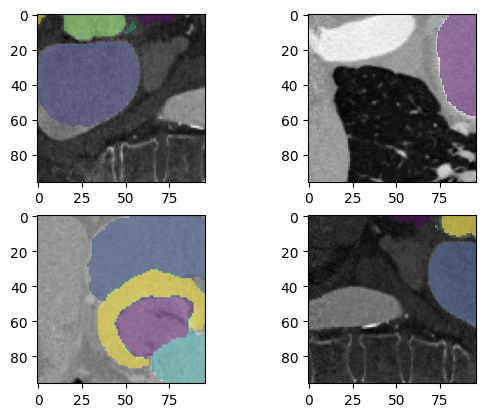

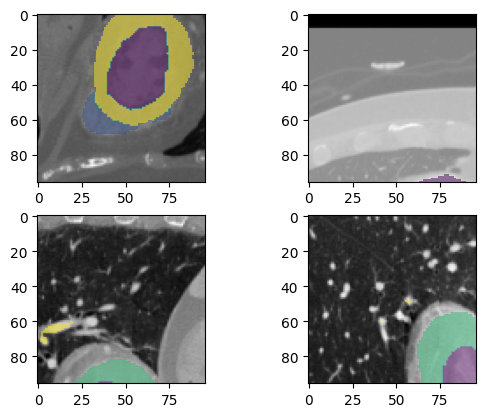

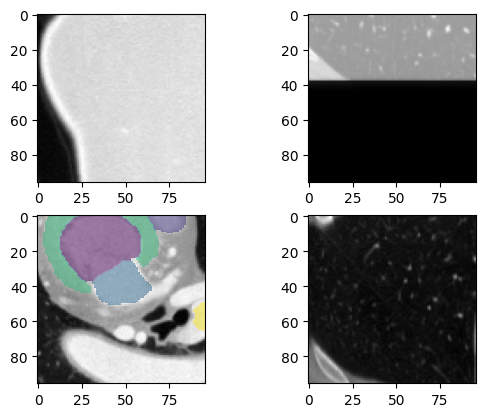

4


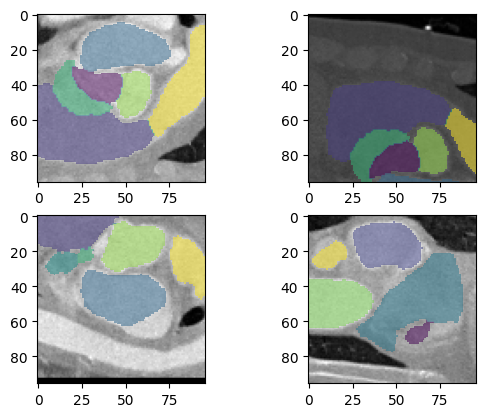

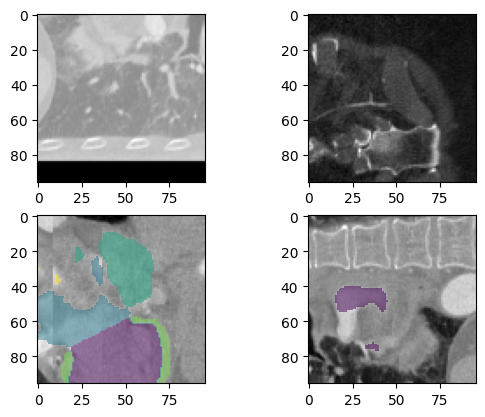

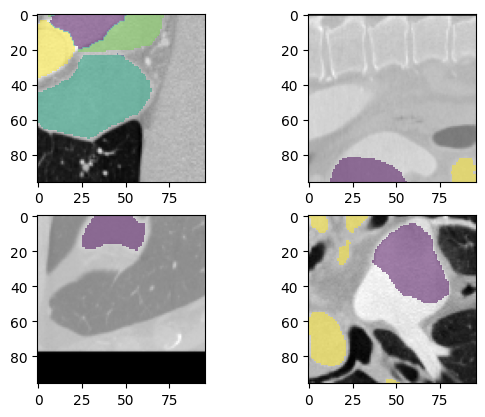

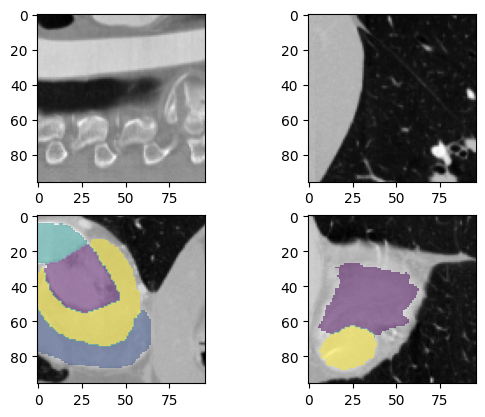

4


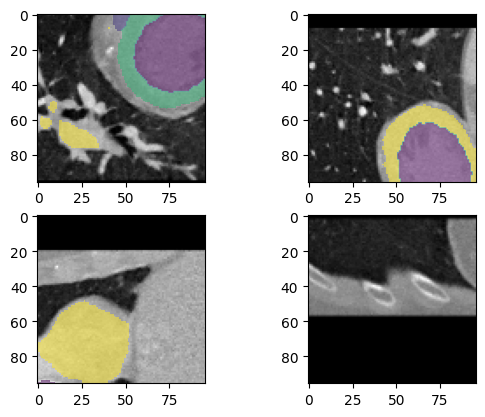

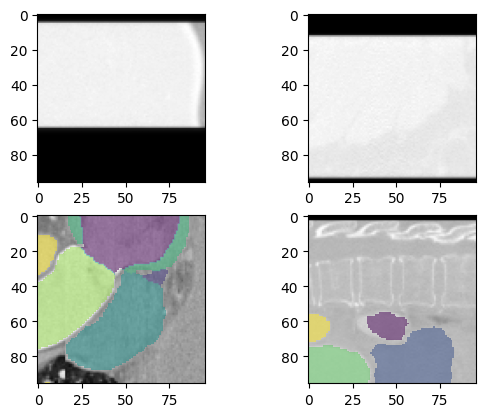

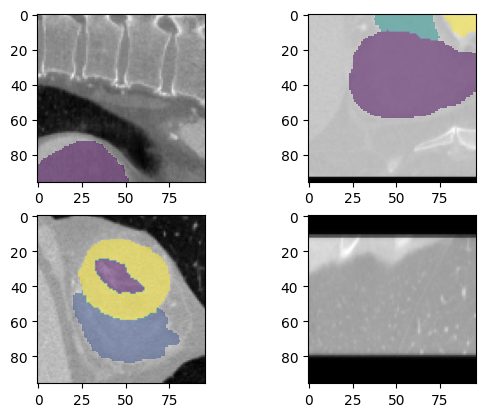

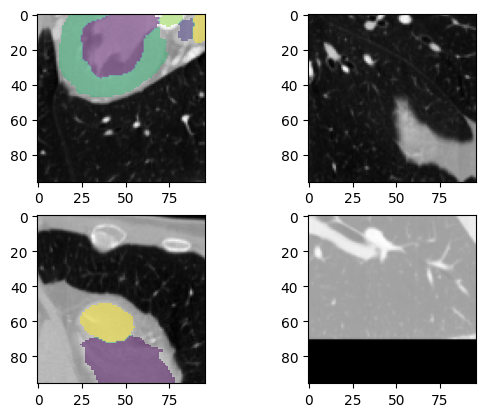

In [33]:
with open('CT.json', 'r') as f:
    dataset = json.load(f)
    print(len(dataset['training']))
    for example in dataset['training']:
        data = train_transforms(example)
        fig, ax = plt.subplots(nrows=2, ncols=2)
        i = 0
        for row in ax:
            for col in row:
                col.imshow(data[i]["image"][0, 90, :, :], cmap="gray")
                data[i]["label"][ data[i]["label"] == 0] = np.nan
                col.imshow(data[i]["label"][0, 90, :, :], alpha=.5)
                i += 1
        plt.show()
    print(len(dataset['validation']))
    for example in dataset['validation']:
        data = train_transforms(example)
        fig, ax = plt.subplots(nrows=2, ncols=2)
        i = 0
        for row in ax:
            for col in row:
                col.imshow(data[i]["image"][0, 90, :, :], cmap="gray")
                data[i]["label"][ data[i]["label"] == 0] = np.nan
                col.imshow(data[i]["label"][0, 90, :, :], alpha=.5)
                i += 1
        plt.show()
    print(len(dataset['test']))
    for example in dataset['test']:
        data = train_transforms(example)
        fig, ax = plt.subplots(nrows=2, ncols=2)
        i = 0
        for row in ax:
            for col in row:
                col.imshow(data[i]["image"][0, 90, :, :], cmap="gray")
                data[i]["label"][ data[i]["label"] == 0] = np.nan
                col.imshow(data[i]["label"][0, 90, :, :], alpha=.5)
                i += 1
        plt.show()


<class 'nibabel.nifti1.Nifti1Image'>
data shape (512, 512, 224)
affine:
[[  -0.45117199    0.            0.          115.5       ]
 [   0.            0.45117199    0.         -102.14889526]
 [   0.            0.            0.625      -200.875     ]
 [   0.            0.            0.            1.        ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : b''
db_name         : b''
extents         : 0
session_error   : 0
regular         : b'r'
dim_info        : 0
dim             : [  3 512 512 224   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : int16
bitpix          : 16
slice_start     : 0
pixdim          : [-1.0000000e+00  4.5117199e-01  4.5117199e-01  6.2500000e-01
  1.0000000e+00  1.6664892e-38  0.0000000e+00  1.6347604e-38]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : <unknown code 48>
xyzt_

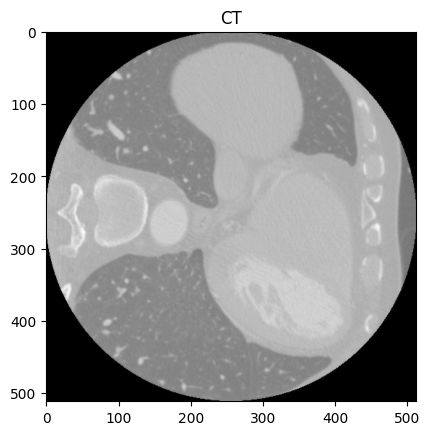

In [4]:
example_ct = nib.load('ct_test/ct_test_2001_image.nii.gz')
print(example_ct)
label = nib.load('MMWHS_evaluation_testdata_label_encrypt_1mm_forpublic/nii/ct_test_2001_label_encrypt_1mm.nii.gz')
example_arr = np.array(example_ct.dataobj)
example_mask_arr = np.array(label.dataobj).astype(np.float16)
print(np.unique(example_mask_arr))
example_mask_arr[example_mask_arr == 0] = np.nan
print(example_arr.shape)
plt.imshow(example_arr[:, :, 70], cmap='gray')
#plt.imshow(example_mask_arr[:, :, 70], alpha=0.5)
plt.title("CT")
plt.show()

In [8]:
# Create JSON CT for test
path='ct_test'
with open('CT_test.json', 'r') as f:
        data = json.load(f)
data['training'] = []
data['validation'] = []
data['test'] = []
files = os.listdir(path)
files = [file for file in files if 'image' in file]
print(len(files))
for file in files:
    data['test'].append({
        "image": os.path.join(path, file)
    })
with open('CT_test.json', 'w') as fp:
    json.dump(data,fp)

40


In [3]:
# Create JSON CT for test
path='mr_test'
with open('MR_test.json', 'r') as f:
        data = json.load(f)
data['training'] = []
data['validation'] = []
data['test'] = []
files = os.listdir(path)
files = [file for file in files if 'image_corrected' in file]
print(len(files))
for file in files:
    data['test'].append({
        "image": os.path.join(path, file)
    })
with open('MR_test.json', 'w') as fp:
    json.dump(data,fp)

40
